<a href="https://colab.research.google.com/github/phytometrics/plant_phenotyping_python/blob/main/notebooks/globalwheat2020.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 小麦の穂検出（未完成）
- kaggle
- yolov8

In [1]:
!pip install -q ultralytics PyYAML
!pip install -q kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.6/599.6 kB 17.9 MB/s eta 0:00:00


# Kaggleの登録、APIキーの取得、データセットの取得

kaggleのアカウントをつくる。googleでログインする
- https://www.kaggle.com/competitions/global-wheat-detection/rules
にアクセスする。利用規約を読み、acceptボタンを押す
- APIキーを発行する

取得したAPIkeyファイルkaggle.jsonの中身をそれぞれ下の二箇所に転記します。
なお、APIキーは自分のアカウントと結びついている個人情報ですので、絶対に他人に知られないようにしてください。

In [2]:
import os
os.environ["KAGGLE_USERNAME"] = "XXXXXXXXX"
os.environ["KAGGLE_KEY"] = "XXXXXXXXXXX"
#googleドライブを接続して、そこからyamlを読み出す設定をした方がよいかもしれない。。。？

In [3]:
!kaggle competitions download global-wheat-detection
!unzip global-wheat-detection.zip -d GlobalWheat2020 > /dev/null 2>&1

 99% 604M/607M [00:05<00:00, 138MB/s]
100% 607M/607M [00:05<00:00, 125MB/s]


## データセット分割

kaggleでホスティングされているデータセット形式では、train/testしかありませんのでtrainをtrain/valに分割します。

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split

In [5]:
df = pd.read_csv("/content/GlobalWheat2020/train.csv")
df

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1
...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2


In [6]:
#Get unique image_id and source
unique_rows = df[["image_id","source"]].drop_duplicates(subset='image_id', keep='first')
train_image_id, val_image_id = train_test_split(unique_rows["image_id"], train_size=0.9, stratify=unique_rows["source"])

print(len(train_image_id),len(val_image_id))  # 3035 338

3035 338


In [7]:
!mkdir yolov8dataset
!mkdir yolov8dataset/train
!mkdir yolov8dataset/val

In [8]:
import ast
import csv

In [9]:
for image_id in train_image_id:
    annotations = df[df["image_id"] == image_id]
    #print(annotations)
    file_name = image_id + ".txt"
    content = []
    for idx, row in annotations.iterrows():
        bbox = row["bbox"]
        # 文字列をリストに変換
        bbox = ast.literal_eval(bbox)
        box_xcenter = (bbox[0] + bbox[2]/2) / row["width"]
        box_ycenter = (bbox[1] + bbox[3]/2) / row["height"]
        box_width = bbox[2] / row["width"]
        box_height = bbox[3] / row["height"]
        s = [0, box_xcenter, box_ycenter, box_width, box_height]
        content.append(s)
    with open(os.path.join("yolov8dataset","train",file_name), "w", newline='') as f:
        csv_writer = csv.writer(f, delimiter=' ')
        # Write the data to the CSV file
        csv_writer.writerows(content)
    src_image_path = os.path.join("/content/GlobalWheat2020", "train", image_id+".jpg")
    dst_image_path = os.path.join("/content/yolov8dataset", "train", image_id+".jpg")
    !ln -s {src_image_path} {dst_image_path}

In [10]:
for image_id in val_image_id:
    annotations = df[df["image_id"] == image_id]
    #print(annotations)
    file_name = image_id + ".txt"
    content = []
    for idx, row in annotations.iterrows():
        bbox = row["bbox"]
        # 文字列をリストに変換
        bbox = ast.literal_eval(bbox)
        box_xcenter = (bbox[0] + bbox[2]/2) / row["width"]
        box_ycenter = (bbox[1] + bbox[3]/2) / row["height"]
        box_width = bbox[2] / row["width"]
        box_height = bbox[3] / row["height"]
        s = [0, box_xcenter, box_ycenter, box_width, box_height]
        content.append(s)
    with open(os.path.join("yolov8dataset","val",file_name), "w", newline='') as f:
        csv_writer = csv.writer(f, delimiter=' ')
        # Write the data to the CSV file
        csv_writer.writerows(content)
    src_image_path = os.path.join("/content/GlobalWheat2020", "train", image_id+".jpg")
    dst_image_path = os.path.join("/content/yolov8dataset", "val", image_id+".jpg")
    !ln -s {src_image_path} {dst_image_path}

In [11]:
import yaml

data = {
    "path": "/content/yolov8dataset",
    "train": "train",
    "val": "val",
    "names": {0: "wheat_head"},
}

with open('wheatconfig.yaml', 'w') as file:
    yaml.dump(data, file)


In [22]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir runs/detect/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [23]:
!yolo task=detect mode=train \
    model=yolov8s.pt imgsz=640 \
        data=wheatconfig.yaml epochs=10 \
            batch=4

Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=wheatconfig.yaml, epochs=10, patience=50, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynam

## テストデータセットで結果を確認

In [24]:
!yolo predict model="/content/runs/detect/train/weights/best.pt" source="/content/GlobalWheat2020/test" imgsz=640


Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/10 /content/GlobalWheat2020/test/2fd875eaa.jpg: 640x640 30 wheat_heads, 6.8ms
image 2/10 /content/GlobalWheat2020/test/348a992bb.jpg: 640x640 40 wheat_heads, 6.4ms
image 3/10 /content/GlobalWheat2020/test/51b3e36ab.jpg: 640x640 25 wheat_heads, 6.4ms
image 4/10 /content/GlobalWheat2020/test/51f1be19e.jpg: 640x640 20 wheat_heads, 6.5ms
image 5/10 /content/GlobalWheat2020/test/53f253011.jpg: 640x640 32 wheat_heads, 6.4ms
image 6/10 /content/GlobalWheat2020/test/796707dd7.jpg: 640x640 23 wheat_heads, 6.7ms
image 7/10 /content/GlobalWheat2020/test/aac893a91.jpg: 640x640 22 wheat_heads, 6.4ms
image 8/10 /content/GlobalWheat2020/test/cb8d261a3.jpg: 640x640 24 wheat_heads, 6.5ms
image 9/10 /content/GlobalWheat2020/test/cc3532ff6.jpg: 640x640 25 wheat_heads, 6.4ms
image 10/10 /content/GlobalWheat2020/test/f5a1f0358.jpg: 

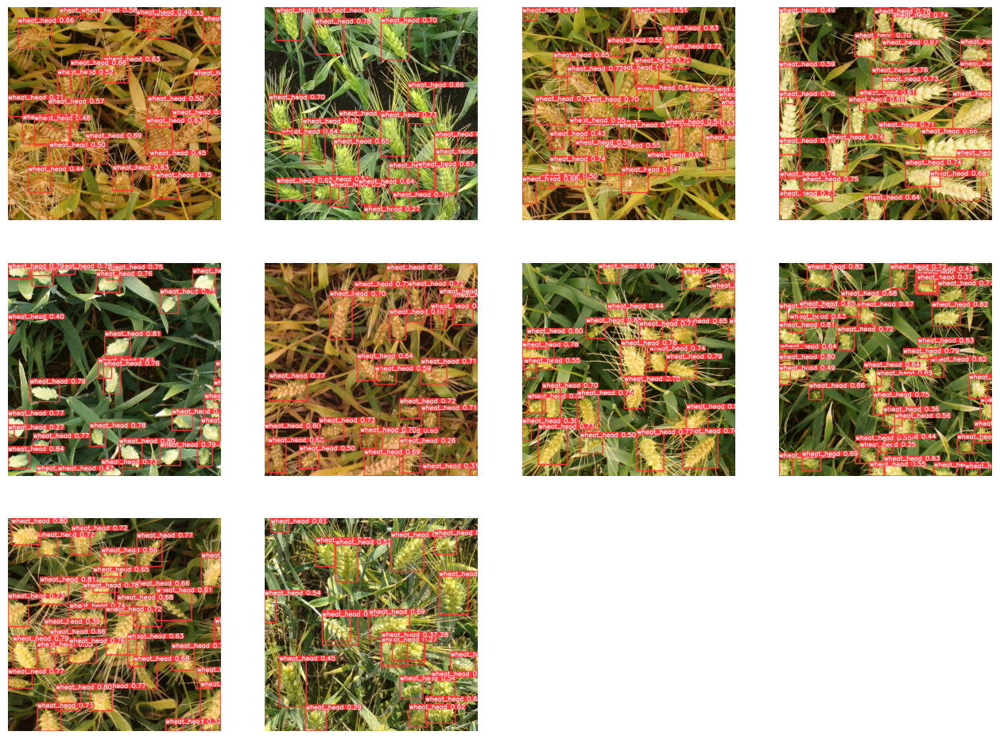

In [31]:
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt

pardir = "/content/runs/detect/predict"
files = os.listdir(pardir)
N = int(np.ceil(np.sqrt(len(files))))

plt.figure(figsize=(16,16))
for i, file in enumerate(files):
    path = os.path.join(pardir, file)
    image = imread(path)
    plt.subplot(N,N, i+1)
    plt.imshow(image)
    plt.axis("off")